In [1]:
using LinearAlgebra
using Plots
using Ripserer
using Images, FileIO
using OffsetArrays
using Distances

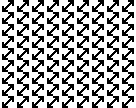

In [2]:
img_path = "../images/testPersisC2.png"
img = Gray.(load(img_path))

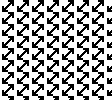

In [3]:
img_cropped = @view img[1:100, 1:112]

In [44]:
dump(img_cropped)

SubArray{Gray{N0f8}, 2, Matrix{Gray{N0f8}}, Tuple{UnitRange{Int64}, UnitRange{Int64}}, false}
  parent: Array{Gray{N0f8}}((108, 136))
    1: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    2: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    3: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    4: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    5: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    ...
    14684: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    14685: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    14686: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    14687: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
    14688: Gray{N0f8}
      val: N0f8
        i: UInt8 0xff
  indices: Tuple{UnitRange{Int64}, UnitRange{Int64}}
    1: UnitRange{Int64}
      start: Int64 1
      stop: Int64 100
    2: UnitRange{Int64}
      start: Int64 1
      stop: Int64 112
  offset1: Int64 0
  stride1: Int64 0


In [44]:
function verticalSlice(img, lens_sz)
    h::Int64, w::Int64 = size(img)
    lx::Int64, ly::Int64 = lens_sz
    lens_corner_x::Int64= floor((w - lx) / 2)
    lens_corner_y::Int64= 1
    data = Array{Gray{N0f8}}(undef, ly, lx, h - ly + 1)
    
    while lens_corner_y <= h - ly + 1
        #snap = @view img[lens_corner_y:lens_corner_y + ly - 1, lens_corner_x:lens_corner_x + lx - 1]
        #push!(data, snap)
        data[:,:,lens_corner_y] = @view img[lens_corner_y:lens_corner_y + ly - 1, lens_corner_x:lens_corner_x + lx - 1]
        lens_corner_y = lens_corner_y + 1
    end
    
    return data
end

verticalSlice (generic function with 1 method)

In [45]:
function horizontalSlice(img, lens_sz)
    h::Int64, w::Int64 = size(img)
    lx::Int64, ly::Int64 = lens_sz
    lens_corner_y::Int64= floor((h - ly) / 2)
    lens_corner_x::Int64= 1
    data = Array{Gray{N0f8}}(undef, ly, lx, w - lx + 1)
    
    while lens_corner_x <= w - lx + 1
        #snap = @view img[lens_corner_y:lens_corner_y + ly - 1, lens_corner_x:lens_corner_x + lx - 1]
        #push!(data, snap)
        data[:,:,lens_corner_x] = @view img[lens_corner_y:lens_corner_y + ly - 1, lens_corner_x:lens_corner_x + lx - 1]
        lens_corner_x = lens_corner_x + 1
    end
    
    return data
end

horizontalSlice (generic function with 1 method)

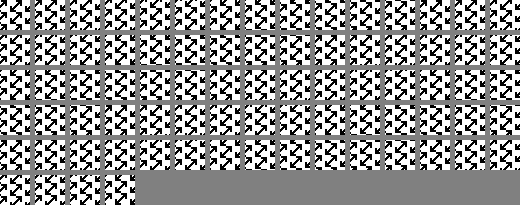

In [46]:
img_list = verticalSlice(img, (30,30))

mosaicview(img_list; fillvalue = .5, ncol = 15, npad = 5, rowmajor = true)

In [49]:
point_list = arrayToPoints(img_list)
unique(x->x, point_list[1])

2-element Vector{Int64}:
 255
   0

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


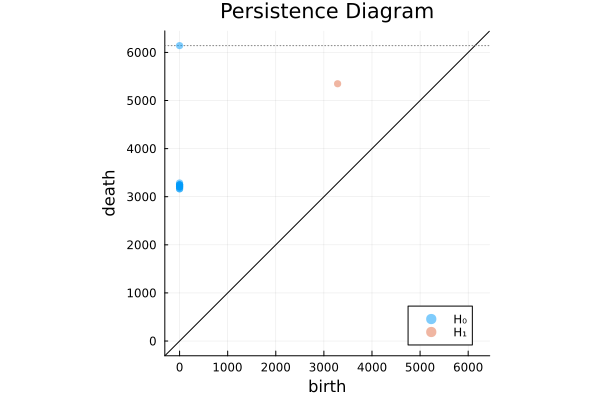

In [50]:
diagram = ripserer(point_list; alg =:involuted)
plot(diagram)

In [51]:
most_persistent_ho = diagram[2][end]

[3290.0, 5350.0) with:
 birth_simplex: Simplex{1, Float64, Int64}
 death_simplex: Simplex{2, Float64, Int64}
 representative: 12-element Chain{Mod{2},Simplex{1, Float64, Int64}}

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


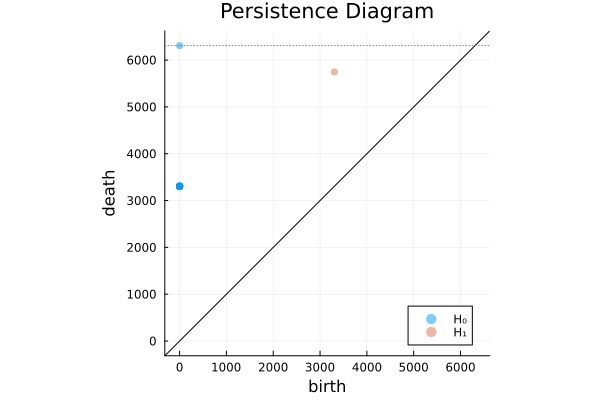

In [52]:
img_list_2 = horizontalSlice(img, (30,30))
point_list_2 = arrayToPoints(img_list_2)
diagram2 = ripserer(point_list_2; alg=:involuted)
plot(diagram2)

In [53]:
most_persistent_ho = diagram2[2][end]

[3310.0, 5750.0) with:
 birth_simplex: Simplex{1, Float64, Int64}
 death_simplex: Simplex{2, Float64, Int64}
 representative: 15-element Chain{Mod{2},Simplex{1, Float64, Int64}}

In [4]:
function randSlice(img, lens_sz, trans, bound = 0)
    h::Int64, w::Int64= size(img)
    # h = floor(h / 2)
    # w = floor(w / 2)
    
    lx::Int64, ly::Int64 = lens_sz
    data = Array{Gray{N0f8}}(undef, ly, lx, trans)
    
    lens_range::Int64 = floor(((minimum(size(img))/sqrt(2))-maximum(lens_sz))/2.0)
    for k = 1:trans
        x = rand(lx: w - lx -1 )
        y = rand(ly: h - ly - 1)
        # print(x)
        # print(" ")
        # print(y)
        # print(" ")
        data[:,:,k] = @view img[y:y + ly - 1, x : x+ lx - 1]
    end
    return data
end

randSlice (generic function with 2 methods)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


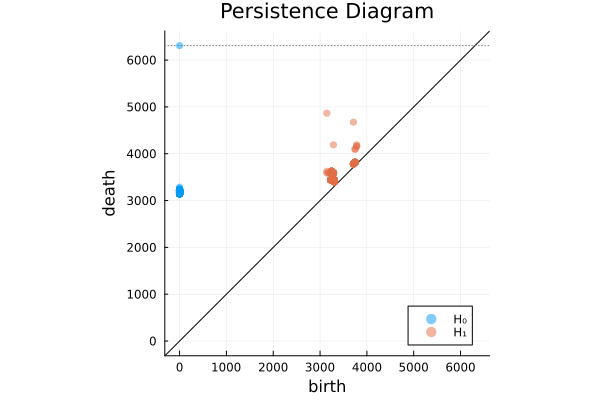

In [55]:
img_list_3 = randSlice(img,(30,30),3000)
point_list_3 = arrayToPoints(img_list_3)
diagram3 = ripserer(point_list_3; reps = true)
plot(diagram3)

In [56]:
most_persistent_co = diagram3[2][end]
filtration = diagram3[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, most_persistent_co)

15-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((66, 32), 3143.851141514178)
 +Simplex{1}((66, 45), 3143.851141514178)
 +Simplex{1}((106, 45), 3143.851141514178)
 +Simplex{1}((122, 106), 3143.851141514178)
 +Simplex{1}((176, 122), 3143.851141514178)
 +Simplex{1}((176, 153), 3143.851141514178)
 +Simplex{1}((153, 38), 3143.851141514178)
 +Simplex{1}((123, 38), 3143.851141514178)
 +Simplex{1}((123, 103), 3143.851141514178)
 +Simplex{1}((107, 103), 3143.851141514178)
 +Simplex{1}((150, 107), 3143.851141514178)
 +Simplex{1}((155, 150), 3143.851141514178)
 +Simplex{1}((155, 44), 3143.851141514178)
 +Simplex{1}((143, 44), 3143.851141514178)
 +Simplex{1}((143, 32), 3143.851141514178)

In [57]:
most_persistent_co = diagram3[2][end - 1]
filtration = diagram3[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, most_persistent_co)

8-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((63, 19), 3712.856043533064)
 +Simplex{1}((139, 63), 3440.1380786241707)
 +Simplex{1}((139, 2), 3440.1380786241707)
 +Simplex{1}((79, 2), 3402.1243363522153)
 +Simplex{1}((170, 79), 3402.1243363522153)
 +Simplex{1}((170, 147), 3440.1380786241707)
 +Simplex{1}((147, 49), 3440.1380786241707)
 +Simplex{1}((49, 19), 3225.523213371747)

In [58]:
most_persistent_co = diagram3[2][end - 2]
filtration = diagram3[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, most_persistent_co)

12-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((133, 62), 3285.445175314907)
 +Simplex{1}((133, 29), 3245.620125646253)
 +Simplex{1}((150, 29), 3245.620125646253)
 +Simplex{1}((164, 150), 3245.620125646253)
 +Simplex{1}((173, 164), 3245.620125646253)
 +Simplex{1}((173, 126), 3285.445175314907)
 +Simplex{1}((141, 126), 3164.4667797276684)
 +Simplex{1}((141, 50), 3205.300297944016)
 +Simplex{1}((71, 50), 3205.300297944016)
 +Simplex{1}((120, 71), 3205.300297944016)
 +Simplex{1}((120, 31), 3205.300297944016)
 +Simplex{1}((62, 31), 3164.4667797276684)

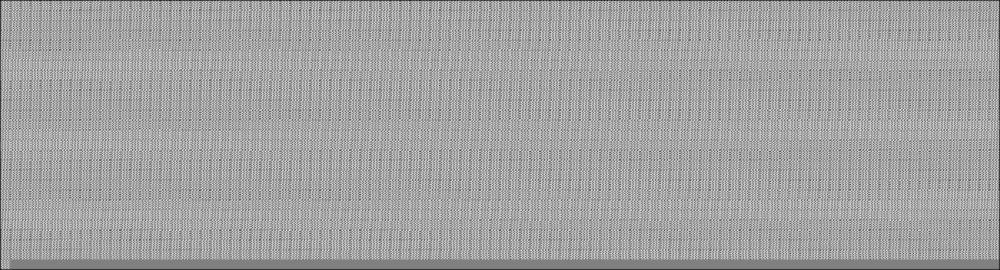

In [59]:
img_list_4 = squareIso(img, (50,50), 50)
# point_list_4 = arrayToPoints(img_list_4)
# diagram4 = ripserer(point_list_4; reps = true)
# plot(diagram4)
mosaicview(img_list_4; fillvalue = .5, ncol = 100, npad = 2, rowmajor = true)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


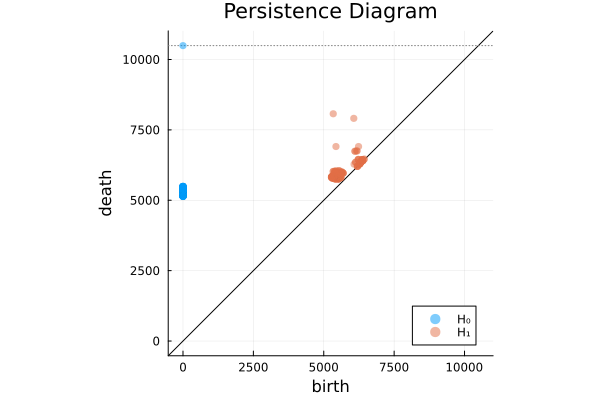

In [60]:
point_list_4 = arrayToPoints(img_list_4)
diagram4 = ripserer(point_list_4; reps = true)
plot(diagram4)

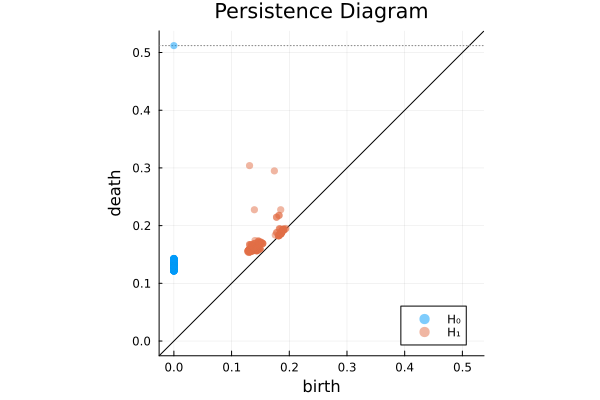

In [107]:
point_list_u = arrayToPoints(img_list_4)
point_list_u = unique(x->x, point_list_u)
diagramu = ripserer(point_list_u; reps = true, metric = BrayCurtis())
plot(diagramu)

In [108]:
most_persistent_co = diagramu[2][end]
filtration = diagramu[2].filtration
# for k = 0: size(diagramu[2])[1] - 1
#     print(size(reconstruct_cycle(filtration, diagramu[2][end - k])))
# end
reconstruct_cycle(filtration, diagramu[2][end - 1])

8-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((90, 12), 0.17415384615384616)
 +Simplex{1}((90, 78), 0.13030116779348494)
 +Simplex{1}((78, 67), 0.16083486801718846)
 +Simplex{1}((67, 56), 0.1605546995377504)
 +Simplex{1}((56, 45), 0.1705354379449087)
 +Simplex{1}((45, 34), 0.1689836268149521)
 +Simplex{1}((34, 23), 0.1625615763546798)
 +Simplex{1}((23, 12), 0.1584127960627499)

In [78]:
most_persistent_co = diagram4[2][end]
filtration = diagram4[2].filtration
# print(size(reconstruct_cycle(filtration, most_persistent_co)))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 1])))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 2])))
# k = size(diagram4[2])
# for k = 0: size(diagram4[2])[1] - 1
#     print(size(reconstruct_cycle(filtration, diagram4[2][end - k])))
# end
reconstruct_cycle(filtration, diagram4[2][end])

12-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((153, 152), 5336.754631796369)
 +Simplex{1}((154, 153), 5336.754631796369)
 +Simplex{1}((155, 154), 5138.10762830052)
 +Simplex{1}((156, 155), 5157.055846119954)
 +Simplex{1}((156, 145), 5157.055846119954)
 +Simplex{1}((146, 145), 5175.934698197032)
 +Simplex{1}((147, 146), 5263.140697340325)
 +Simplex{1}((148, 147), 5263.140697340325)
 +Simplex{1}((149, 148), 5175.934698197032)
 +Simplex{1}((150, 149), 5157.055846119954)
 +Simplex{1}((151, 150), 5157.055846119954)
 +Simplex{1}((152, 151), 5138.10762830052)

In [76]:
most_persistent_co = diagram4[2][end - 1]
filtration = diagram4[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, most_persistent_co)

8-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((90, 12), 6066.642399218863)
 +Simplex{1}((90, 78), 5250.77137190337)
 +Simplex{1}((78, 67), 5837.216802552394)
 +Simplex{1}((67, 56), 5820.483227361797)
 +Simplex{1}((56, 45), 5985.7142430958065)
 +Simplex{1}((45, 34), 5963.947937398515)
 +Simplex{1}((34, 23), 5859.453899468789)
 +Simplex{1}((23, 12), 5786.87091613421)

In [65]:
most_persistent_co = diagram4[2][end - 2]
filtration = diagram4[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, most_persistent_co)

15-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((58, 46), 5433.355316928942)
 +Simplex{1}((70, 58), 5409.366876077089)
 +Simplex{1}((82, 70), 5409.366876077089)
 +Simplex{1}((94, 82), 5250.77137190337)
 +Simplex{1}((106, 94), 5361.067990615303)
 +Simplex{1}((118, 106), 5312.329997279913)
 +Simplex{1}((130, 118), 5287.792545098569)
 +Simplex{1}((142, 130), 5385.2715808954335)
 +Simplex{1}((154, 142), 5385.2715808954335)
 +Simplex{1}((166, 154), 5275.481020722186)
 +Simplex{1}((178, 166), 5300.075471160764)
 +Simplex{1}((178, 10), 5348.925125667773)
 +Simplex{1}((22, 10), 5250.77137190337)
 +Simplex{1}((34, 22), 5409.366876077089)
 +Simplex{1}((46, 34), 5409.366876077089)

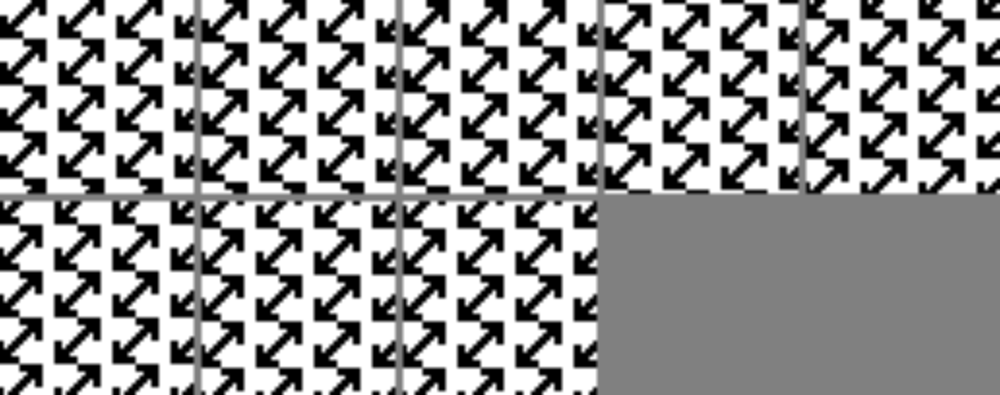

In [79]:
image_indexes = []
for i in reconstructed_at_birth
    temp = vertices(i)
    push!(image_indexes, temp[1])
    push!(image_indexes, temp[2])
end
sort!(image_indexes)
image_indexes = unique(x->x, image_indexes)
images = Array{Gray{N0f8}}(undef, 50, 50, size(image_indexes)[1])
for (i,k) in zip(image_indexes,1:size(image_indexes)[1])
    images[:,:,k] = img_list_4[:,:,i]
    # print("$(k) and $(i)\n")
end
# images
displ = mosaicview(images; fillvalue = .5, ncol = 5, npad = 2, rowmajor = true)
percentage_scale = 4
new_size = trunc.(Int, size(displ) .* percentage_scale)
img_rescaled = imresize(displ, new_size)

In [67]:
clock(x) = (x % 100) , floor( x / 100) + 1
map(clock, deepcopy(image_indexes))

15-element Vector{Tuple{Int64, Float64}}:
 (10, 1.0)
 (22, 1.0)
 (34, 1.0)
 (46, 1.0)
 (58, 1.0)
 (70, 1.0)
 (82, 1.0)
 (94, 1.0)
 (6, 2.0)
 (18, 2.0)
 (30, 2.0)
 (42, 2.0)
 (54, 2.0)
 (66, 2.0)
 (78, 2.0)

In [3]:
function squareIso(img, lens_sz, square_bound)
    if square_bound > maximum(size(img)) / 2
        lens_range = minimum(size(img))
    else
        lens_range = square_bound
    end
    lx::Int64, ly::Int64 = lens_sz
    h, w = size(img)
    # print(h)
    # print(w)
    xst::Int64, xend::Int64 = floor(floor(w / 2) - lens_range), floor(floor(w / 2) + lens_range - lx)
    yst::Int64, yend::Int64 = floor(floor(h / 2) - lens_range), floor(floor(h / 2) + lens_range - ly)
    
    data = Array{Gray{N0f8}}(undef, ly, lx, (xend - xst + 1) * (yend - yst + 1))
    # print(size(data))
    k::Int64 = 1
    for x::Int64 = xst : xend
        for y::Int64  in yst : yend
            # print(y); print(" ")
            # print(x); print(" ")
            data[:,:,k] = @view img[y:y + ly - 1, x : x+ lx - 1]
            k+=1
            # print("$(k) ")
        end
    end
        
    return data
        
end

squareIso (generic function with 1 method)

In [2]:
function arrayToPoints(img_list)
    y, x, z = size(img_list)
    point_list = Vector{Vector{Int64}}(undef, z)
    for k = 1:z
        point_list[k] = collect(Iterators.flatten(Int64.(rawview(channelview(img_list[:,:,k])))))

    end
    return point_list
end

arrayToPoints (generic function with 1 method)

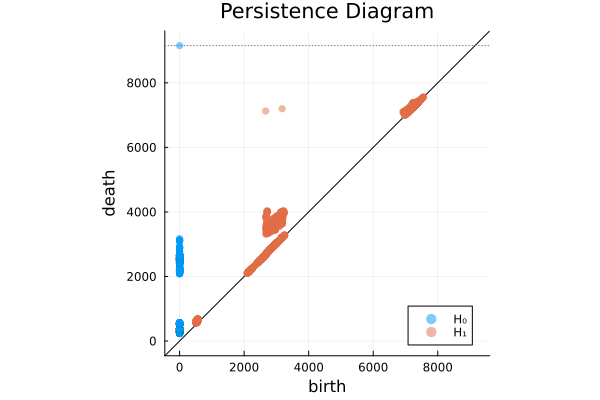

In [69]:
img_path = "../images/C4pinwheel.png"
img2 = Gray.(load(img_path))

img_list_5 = squareIso(img2,(50,50),50)

point_list_5 = arrayToPoints(img_list_5)
diagram5 = ripserer(point_list_5; reps = true, modulus = 2)
plot(diagram5)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


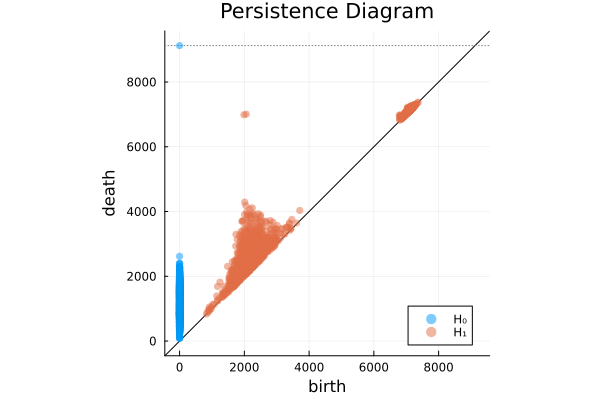

In [114]:
img_path = "../images/C4pinwheel.png"
img2 = Gray.(load(img_path))

img_list_5 = randSlice(img2,(50,50),3000)

point_list_5 = arrayToPoints(img_list_5)
diagram5 = ripserer(point_list_5; reps = true, modulus = 2)
plot(diagram5)

In [115]:
mpc = diagram5[2][end]
filtration = diagram5[2].filtration
# print(size(reconstruct_cycle(filtration, most_persistent_co)))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 1])))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 2])))
# k = size(diagram4[2])
for k = 0: size(diagram5[2])[1] - 1
    print(size(reconstruct_cycle(filtration, diagram5[2][end - k])))
end

(119,)(77,)(90,)(49,)(24,)(74,)(68,)(54,)(68,)(26,)(31,)(41,)(30,)(55,)(22,)(32,)(17,)(20,)(22,)(20,)(27,)(15,)(38,)(19,)(18,)(11,)(24,)(59,)(16,)(12,)(53,)(26,)(37,)(13,)(13,)(16,)(12,)(14,)(42,)(50,)(44,)(20,)(13,)(23,)(23,)(13,)(38,)(16,)(20,)(14,)(16,)(20,)(19,)(11,)(13,)(20,)(12,)(13,)(18,)(13,)(14,)(10,)(11,)(13,)(17,)(11,)(11,)(21,)(30,)(14,)(28,)(8,)(13,)(18,)(9,)(20,)(10,)(12,)(18,)(15,)(11,)(8,)(11,)(28,)(10,)(12,)(29,)(14,)(18,)(10,)(16,)(21,)(15,)(7,)(15,)(12,)(15,)(9,)(10,)(13,)(13,)(10,)(15,)(9,)(11,)(11,)(16,)(9,)(7,)(8,)(12,)(10,)(15,)(20,)(12,)(8,)(9,)(18,)(17,)(17,)(11,)(9,)(10,)(8,)(12,)(7,)(8,)(8,)(10,)(14,)(9,)(7,)(9,)(15,)(13,)(10,)(10,)(9,)(10,)(11,)(14,)(17,)(9,)(8,)(7,)(14,)(11,)(15,)(8,)(11,)(12,)(10,)(15,)(7,)(10,)(6,)(11,)(9,)(7,)(10,)(14,)(8,)(6,)(16,)(17,)(16,)(10,)(8,)(14,)(5,)(7,)(11,)(13,)(10,)(6,)(10,)(9,)(11,)(13,)(9,)(8,)(6,)(13,)(8,)(12,)(7,)(8,)(9,)(8,)(8,)(9,)(17,)(7,)(7,)(8,)(5,)(6,)(6,)(6,)(10,)(10,)(6,)(8,)(6,)(7,)(6,)(7,)(13,)(12,)(10,)(8,)(7,

In [89]:
filtration = diagram5[2].filtration
reconstructed_at_birth = reconstruct_cycle(filtration, diagram5[2][end - 0])

33-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((1513, 1462), 2667.301445281354)
 +Simplex{1}((1513, 34), 493.8106924723279)
 +Simplex{1}((1564, 34), 2614.752952001393)
 +Simplex{1}((1564, 85), 527.9517023364922)
 +Simplex{1}((1615, 85), 2527.4160718013964)
 +Simplex{1}((1666, 1615), 2656.3047641413436)
 +Simplex{1}((1717, 1666), 2657.802851981313)
 +Simplex{1}((1768, 1717), 2654.8188262101803)
 +Simplex{1}((1819, 1768), 2655.6460607543318)
 +Simplex{1}((1870, 1819), 2655.874808796529)
 +Simplex{1}((1921, 1870), 2657.916101008457)
 +Simplex{1}((1972, 1921), 2657.916101008457)
 +Simplex{1}((1972, 493), 527.9517023364922)
 ⋮
 +Simplex{1}((2380, 2329), 2314.991792642039)
 +Simplex{1}((2431, 2380), 2238.3359890776005)
 +Simplex{1}((2482, 2431), 2270.3032837046244)
 +Simplex{1}((2533, 2482), 2382.8976058572052)
 +Simplex{1}((2584, 2533), 2355.9949066158865)
 +Simplex{1}((2584, 1156), 2553.968872167396)
 +Simplex{1}((1207, 1156), 2432.619164604275)
 +Simplex{1}((1258, 1207), 2506

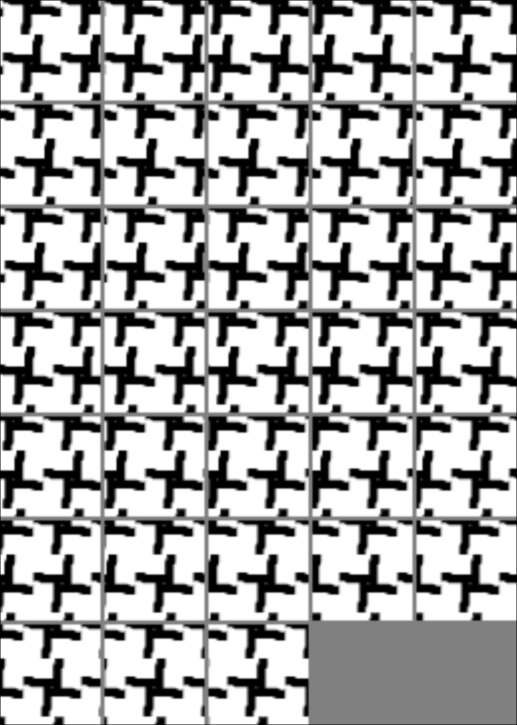

In [90]:
image_indexes = []
for i in reconstructed_at_birth
    temp = vertices(i)
    push!(image_indexes, temp[1])
    push!(image_indexes, temp[2])
end
sort!(image_indexes)
image_indexes = unique(x->x, image_indexes)
images = Array{Gray{N0f8}}(undef, 50, 50, size(image_indexes)[1])
for (i,k) in zip(image_indexes,1:size(image_indexes)[1])
    images[:,:,k] = img_list_5[:,:,i]
    # print("$(k) and $(i)\n")
end
# images
displ = mosaicview(images; fillvalue = .5, ncol = 5, npad = 2, rowmajor = true)
percentage_scale = 4
new_size = trunc.(Int, size(displ) .* percentage_scale)
img_rescaled = imresize(displ, new_size)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


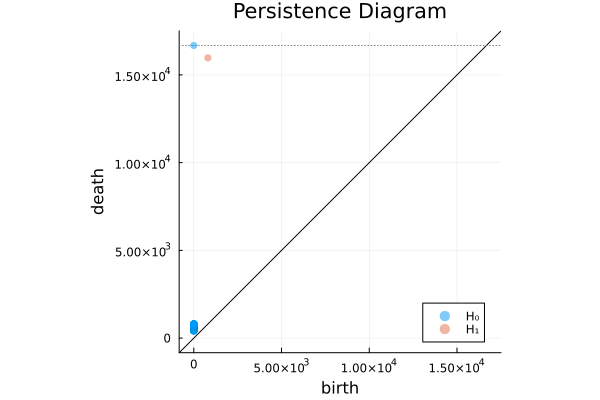

In [80]:
img_list_6 = horizontalSlice(img2, (100,100))
point_list_6 = arrayToPoints(img_list_6)
diagram6 = ripserer(point_list_6; reps = true)
plot(diagram6)

In [82]:
filtration = diagram6[2].filtration
reconstruct_cycle(filtration, diagram6[2][end])

805-element Vector{Simplex{1, Float64, Int64}}:
 +Simplex{1}((598, 162), 803.2652114961783)
 +Simplex{1}((598, 191), 499.2354154104054)
 +Simplex{1}((627, 191), 719.6242074861017)
 +Simplex{1}((627, 220), 570.2139949176975)
 +Simplex{1}((656, 220), 721.5012127501935)
 +Simplex{1}((656, 249), 485.8662367359971)
 +Simplex{1}((685, 249), 653.5395932917913)
 +Simplex{1}((685, 278), 791.3993934796766)
 +Simplex{1}((714, 278), 600.5547435496618)
 +Simplex{1}((714, 307), 644.8488194918248)
 +Simplex{1}((743, 307), 674.0066765247952)
 +Simplex{1}((743, 336), 642.5869590958099)
 +Simplex{1}((772, 336), 588.4258661887663)
 ⋮
 +Simplex{1}((831, 424), 666.4150358447804)
 +Simplex{1}((424, 17), 649.4151214747005)
 +Simplex{1}((453, 17), 600.6055277800896)
 +Simplex{1}((453, 46), 654.9381650201796)
 +Simplex{1}((482, 46), 788.8282449304157)
 +Simplex{1}((482, 75), 509.06581106964944)
 +Simplex{1}((511, 75), 724.2582412371985)
 +Simplex{1}((511, 104), 567.3305914544006)
 +Simplex{1}((540, 104), 724.4

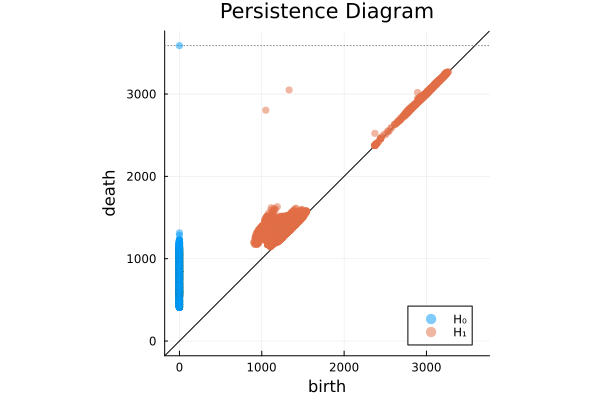

In [ ]:
img_path = "../images/C1 horsehex.png"
img3 = Gray.(load(img_path))

img_list_7 = squareIso(img3,(70,70),70)

point_list_7 = arrayToPoints(img_list_7)
diagram7 = ripserer(point_list_7; reps = true, modulus = 2)
plot(diagram7)

In [135]:
mpc = diagram7[2][end]
filtration = diagram7[2].filtration
# print(size(reconstruct_cycle(filtration, most_persistent_co)))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 1])))
# print(size(reconstruct_cycle(filtration, diagram4[2][end - 2])))
# k = size(diagram4[2])
for k = 0: size(diagram7[2])[1] - 1
    print(size(reconstruct_cycle(filtration, diagram7[2][end - k])))
end

(58,)(67,)(85,)(58,)(58,)(58,)(58,)(14,)(58,)(6,)(6,)(14,)(14,)(60,)(6,)(6,)(6,)(61,)(61,)(61,)(60,)(14,)(14,)(61,)(6,)(6,)(14,)(6,)(6,)(70,)(6,)(6,)(6,)(6,)(70,)(6,)(6,)(6,)(58,)(6,)(6,)(14,)(6,)(6,)(6,)(6,)(6,)(6,)(14,)(6,)(79,)(6,)(58,)(79,)(6,)(6,)(10,)(6,)(75,)(14,)(6,)(61,)(6,)(6,)(61,)(6,)(58,)(58,)(58,)(58,)(58,)(58,)(58,)(14,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(10,)(6,)(6,)(10,)(6,)(6,)(58,)(6,)(125,)(6,)(60,)(6,)(6,)(6,)(44,)(6,)(44,)(6,)(58,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(66,)(6,)(6,)(6,)(6,)(6,)(60,)(6,)(14,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(54,)(6,)(6,)(6,)(54,)(14,)(6,)(6,)(60,)(6,)(44,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(6,)(51,)(6,)(6,)(6,)(10,)(6,)(6,)(6,)(6,)(6,)(52,)(6,)(49,)(6,)(43,)(51,)(6,)(6,)(6,)(6,)(6,)(14,)(6,)(6,)(6,)(6,)(10,)(6,)(7,)(6,)(67,)(14,)(6,)(7,)(58,)(14,)(6,)(67,)(7,)(6,)(6,)(6,)(10,)(7,)(40,)(6,)(6,)(70,)(6,)(6,)(6,)(7,)(10,)(6,)(6,)(6,)(6,)(6,)(51,)(6,)(7,)(10,)(6,)(70,)(6,)(6,)(6,)(6,)(6,)(7,)(6,)(6,)(36,)(58,)(6,)(6,)(6,)(6,)(10,)(6,

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


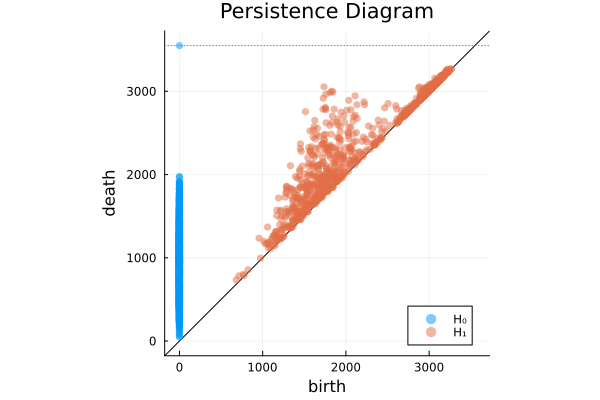

In [139]:
img_list_8 = randSlice(img3,(70,70),2000)

point_list_8 = arrayToPoints(img_list_8)
diagram8 = ripserer(point_list_8; reps = true, modulus = 2)
plot(diagram8)

In [140]:

mpc = diagram8[2][end]
filtration = diagram8[2].filtration
print(size(reconstruct_cycle(filtration, mpc)))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 1])))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 2])))

(51,)(51,)(47,)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


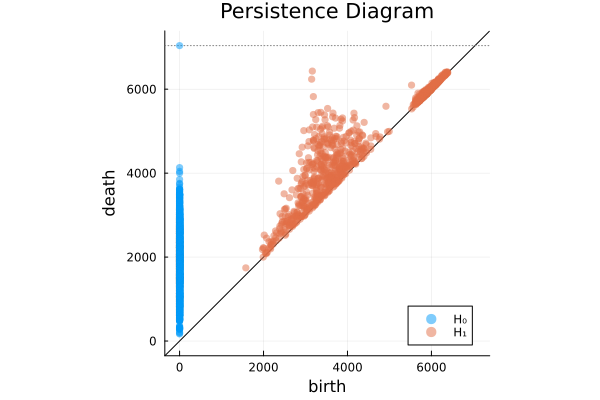

In [141]:
img_list_8 = randSlice(img3,(140,140),2000)

point_list_8 = arrayToPoints(img_list_8)
diagram8 = ripserer(point_list_8; reps = true, modulus = 2)
plot(diagram8)

In [142]:

mpc = diagram8[2][end]
filtration = diagram8[2].filtration
print(size(reconstruct_cycle(filtration, mpc)))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 1])))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 2])))

(83,)(75,)(72,)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


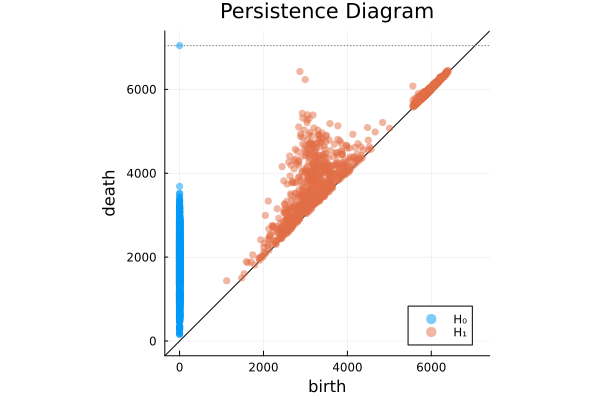

In [143]:
img_list_8 = randSlice(img3,(140,140),2500)

point_list_8 = arrayToPoints(img_list_8)
diagram8 = ripserer(point_list_8; reps = true, modulus = 2)
plot(diagram8)

In [144]:

mpc = diagram8[2][end]
filtration = diagram8[2].filtration
print(size(reconstruct_cycle(filtration, mpc)))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 1])))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 2])))

(103,)(77,)(89,)

┌ Warning: points not unique
└ @ Ripserer C:\Users\user\.julia\packages\Ripserer\RPZgP\src\filtrations\rips.jl:228


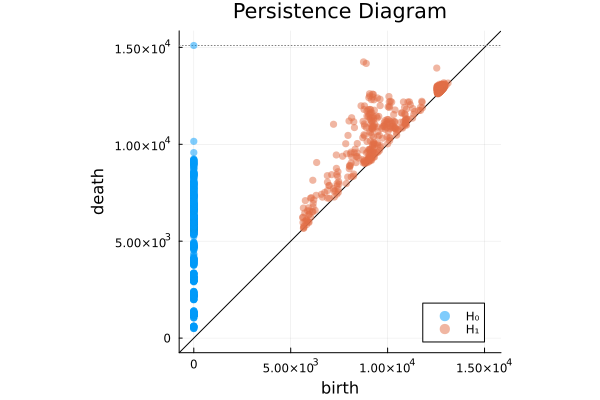

In [145]:
img_list_8 = randSlice(img3,(300,300),1000)

point_list_8 = arrayToPoints(img_list_8)
diagram8 = ripserer(point_list_8; reps = true, modulus = 2)
plot(diagram8)

In [146]:

mpc = diagram8[2][end]
filtration = diagram8[2].filtration
print(size(reconstruct_cycle(filtration, mpc)))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 1])))
print(size(reconstruct_cycle(filtration, diagram8[2][end - 2])))

(65,)(35,)(13,)

In [ ]:
img_path = "../images/C1 horsehex.png"
img3 = Gray.(load(img_path))
img_list_7 = squareIso(img3,(300,300),185)

point_list_7 = arrayToPoints(img_list_7)
diagram7 = ripserer(point_list_7; reps = true, modulus = 2)
plot(diagram7)